   ## Download dati da Kaggle a Colab:

1. Go to your kaggle account, Scroll to API section and Click Expire API Token to remove previous tokens
2. Click on Create New API Token - It will download kaggle.json file on your machine.
3. Go to your Google Colab project file and run the following commands:

In [ ]:
! pip install -q kaggle

__Now upload the kaggle.json file:__

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"luanvenancio","key":"69af3785d28da966158659880a52fb54"}'}

In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets list

ref                                                        title                                           size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------  ---------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
salvatorerastelli/spotify-and-youtube                      Spotify and Youtube                              9MB  2023-03-20 15:43:25           5348        202  1.0              
erdemtaha/cancer-data                                      Cancer Data                                     49KB  2023-03-22 07:57:00           1239         34  1.0              
ulrikthygepedersen/fastfood-nutrition                      Fastfood Nutrition                              12KB  2023-03-21 10:02:41           1502         37  1.0              
lokeshparab/amazon-products-dataset                        Amazon Products Sales Dataset 2023              80M

In [ ]:
!kaggle datasets download -d emmarex/plantdisease

 99% 654M/658M [00:03<00:00, 187MB/s]
100% 658M/658M [00:03<00:00, 201MB/s]


In [ ]:
!ls



kaggle.json  plantdisease.zip  sample_data


In [ ]:
!unzip plantdisease.zip

In [ ]:
import tensorflow as tf
zip_file = tf.keras.utils.get_file(origin='https://storage.googleapis.com/plantdata/PlantVillage.zip',
                                   fname='PlantVillage.zip', extract=True)

856839084/856839084 [==============================] - 10s 0us/step


## Esplorazione dati

In [ ]:
import os
from pathlib import Path
data_dir = Path('PlantVillage')
#random_seed = 111

categories = os.listdir(data_dir)
print("List of categories = ",categories,"\n\nNo. of categories = ", len(categories))

List of categories =  ['train', 'validation'] 

No. of categories =  2


## Loading the dataset

In [ ]:
!pip install -q datasets transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.7/468.7 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 72.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 kB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 20.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 73.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 108.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 32.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 21.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 kB 15.1 MB/s eta 0:00:00


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
%%capture
!sudo apt -qq install git-lfs
!git config --global credential.helper store

In [ ]:
from datasets import load_dataset

In [ ]:
ds = load_dataset("imagefolder", data_dir=data_dir)

ModuleNotFoundError: ignored

In [ ]:
ds

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 20638
    })
})

In [ ]:
example = ds["train"][10]
example

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256 at 0x7F0E6A434E80>,
 'label': 0}

In [ ]:
ds["train"].features

{'image': Image(decode=True, id=None),
 'label': ClassLabel(names=['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy'], id=None)}

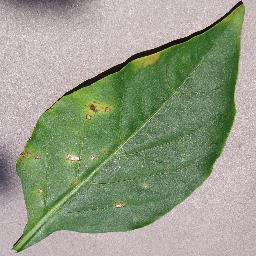

In [ ]:
example['image']

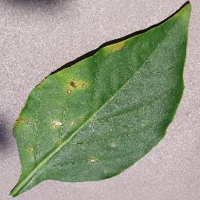

In [ ]:
example['image'].resize((200, 200))

In [ ]:
example['label']

0

In [ ]:
ds["train"].features["label"]

ClassLabel(names=['Pepper__bell___Bacterial_spot', 'Pepper__bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Tomato_Bacterial_spot', 'Tomato_Early_blight', 'Tomato_Late_blight', 'Tomato_Leaf_Mold', 'Tomato_Septoria_leaf_spot', 'Tomato_Spider_mites_Two_spotted_spider_mite', 'Tomato__Target_Spot', 'Tomato__Tomato_YellowLeaf__Curl_Virus', 'Tomato__Tomato_mosaic_virus', 'Tomato_healthy'], id=None)

In [ ]:
labels = ds["train"].features["label"].names
label2id, id2label = dict(), dict()
for i, label in enumerate(labels):
    label2id[label] = i
    id2label[i] = label

id2label[2]

'Potato___Early_blight'

## Preprocessing the data

In [ ]:
model_checkpoint = "microsoft/swin-tiny-patch4-window7-224" # pre-trained model from which to fine-tune
batch_size = 32 # batch size for training and evaluation

In [ ]:
from transformers import AutoFeatureExtractor

feature_extractor = AutoFeatureExtractor.from_pretrained(model_checkpoint)
feature_extractor

/usr/local/lib/python3.9/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


ViTFeatureExtractor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "feature_extractor_type": "ViTFeatureExtractor",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "ViTFeatureExtractor",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [ ]:
from torchvision.transforms import (
    CenterCrop,
    Compose,
    Normalize,
    RandomHorizontalFlip,
    RandomResizedCrop,
    Resize,
    ToTensor,
)

normalize = Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)
train_transforms = Compose(
        [
            RandomResizedCrop(feature_extractor.size["height"]),
            RandomHorizontalFlip(),
            ToTensor(),
            normalize,
        ]
    )

val_transforms = Compose(
        [
            Resize(feature_extractor.size["height"]),
            CenterCrop(feature_extractor.size["height"]),
            ToTensor(),
            normalize,
        ]
    )

def preprocess_train(example_batch):
    """Apply train_transforms across a batch."""
    example_batch["pixel_values"] = [
        train_transforms(image.convert("RGB")) for image in example_batch["image"]
    ]
    return example_batch

def preprocess_val(example_batch):
    """Apply val_transforms across a batch."""
    example_batch["pixel_values"] = [val_transforms(image.convert("RGB")) for image in example_batch["image"]]
    return example_batch

In [ ]:
# split up training into training + validation
splits = ds["train"].train_test_split(test_size=0.1)
train_ds = splits['train']
val_ds = splits['test']

In [ ]:
train_ds.set_transform(preprocess_train)
val_ds.set_transform(preprocess_val)

In [ ]:
train_ds[0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=256x256 at 0x7F0D4CB9F2E0>,
 'label': 7,
 'pixel_values': tensor([[[-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          ...,
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179],
          [-2.1179, -2.1179, -2.1179,  ..., -2.1179, -2.1179, -2.1179]],
 
         [[-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          ...,
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, -2.0357, -2.0357],
          [-2.0357, -2.0357, -2.0357,  ..., -2.0357, 

## Training the model

In [ ]:
from transformers import AutoModelForImageClassification, TrainingArguments, Trainer
#ignore_mismatched_sizes = True, # provide this in case you're planning to fine-tune an already fine-tuned checkpoint
model = AutoModelForImageClassification.from_pretrained(
    model_checkpoint,
    label2id=label2id,
    id2label=id2label,
    ignore_mismatched_sizes = True,
)

Some weights of SwinForImageClassification were not initialized from the model checkpoint at microsoft/swin-tiny-patch4-window7-224 and are newly initialized because the shapes did not match:
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([15, 768]) in the model instantiated
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([15]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model_name = model_checkpoint.split("/")[-1]

args = TrainingArguments(
    f"{model_name}-finetuned-plantdisease",
    remove_unused_columns=False,
    evaluation_strategy = "epoch",
    save_strategy = "epoch",
    learning_rate=5e-5,
    per_device_train_batch_size=batch_size,
    gradient_accumulation_steps=4,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=1,
    warmup_ratio=0.1,
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model="accuracy",
    push_to_hub=True,
)

In [ ]:
from datasets import load_metric

metric = load_metric("accuracy")


<ipython-input-31-350fcae91df9>:3: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  metric = load_metric("accuracy")


In [ ]:
import numpy as np
# the compute_metrics function takes a Named Tuple as input:
# predictions, which are the logits of the model as Numpy arrays,
# and label_ids, which are the ground-truth labels as Numpy arrays.
def compute_metrics(eval_pred):
    """Computes accuracy on a batch of predictions"""
    predictions = np.argmax(eval_pred.predictions, axis=1)
    return metric.compute(predictions=predictions, references=eval_pred.label_ids)

In [ ]:
import torch

def collate_fn(examples):
    pixel_values = torch.stack([example["pixel_values"] for example in examples])
    labels = torch.tensor([example["label"] for example in examples])
    return {"pixel_values": pixel_values, "labels": labels}

In [ ]:
trainer = Trainer(
    model,
    args,
    train_dataset=train_ds,
    eval_dataset=val_ds,
    tokenizer=feature_extractor,
    compute_metrics=compute_metrics,
    data_collator=collate_fn,
)

Cloning https://huggingface.co/surgeonwz/swin-tiny-patch4-window7-224-finetuned-plantdisease into local empty directory.


In [ ]:
train_results = trainer.train()

/usr/local/lib/python3.9/dist-packages/transformers/optimization.py:391: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy
0,0.212600,0.103452,0.972384


In [ ]:
# rest is optional but nice to have
trainer.save_model()
trainer.log_metrics("train", train_results.metrics)
trainer.save_metrics("train", train_results.metrics)
trainer.save_state()

Several commits (2) will be pushed upstream.
The progress bars may be unreliable.


Upload file runs/Apr11_03-33-04_ce8555e14f77/events.out.tfevents.1681183996.ce8555e14f77.321.0:   0%|         …

To https://huggingface.co/surgeonwz/swin-tiny-patch4-window7-224-finetuned-plantdisease
   f8c7ffa..16e2b3c  main -> main

   f8c7ffa..16e2b3c  main -> main

To https://huggingface.co/surgeonwz/swin-tiny-patch4-window7-224-finetuned-plantdisease
   16e2b3c..3e76c5c  main -> main

   16e2b3c..3e76c5c  main -> main



***** train metrics *****
  epoch                    =         1.0
  total_flos               = 429800463GF
  train_loss               =      0.7368
  train_runtime            =  0:05:25.40
  train_samples_per_second =       57.08
  train_steps_per_second   =       0.446


In [ ]:
metrics = trainer.evaluate()
# some nice to haves:
trainer.log_metrics("eval", metrics)
trainer.save_metrics("eval", metrics)

***** eval metrics *****
  epoch                   =        1.0
  eval_accuracy           =     0.9724
  eval_loss               =     0.1035
  eval_runtime            = 0:00:16.51
  eval_samples_per_second =    124.949
  eval_steps_per_second   =      3.935


In [ ]:
from huggingface_hub import notebook_login

notebook_login()

Token is valid.
Your token has been saved in your configured git credential helpers (store).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
trainer.push_to_hub()

## Inference

In [ ]:
from transformers import pipeline

pipe = pipeline("image-classification", "surgeonwz/swin-tiny-patch4-window7-224-finetuned-plantdisease")

/usr/local/lib/python3.9/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [ ]:
from google.colab import files
files.upload()

Saving requeima+manchas+grandes_000gw6fn2mm02wx7ha0myh2loys0cnwf.JPG.jpg to requeima+manchas+grandes_000gw6fn2mm02wx7ha0myh2loys0cnwf.JPG.jpg


{'requeima+manchas+grandes_000gw6fn2mm02wx7ha0myh2loys0cnwf.JPG.jpg': b'\xff\xd8\xff\xe1Y\x1fExif\x00\x00II*\x00\x08\x00\x00\x00\x11\x00\x0e\x01\x02\x00 \x00\x00\x00\xda\x00\x00\x00\x0f\x01\x02\x00\x05\x00\x00\x00\xfa\x00\x00\x00\x10\x01\x02\x00\x08\x00\x00\x00\x00\x01\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00\x08\x01\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\x10\x01\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00\x18\x01\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x02\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00H\x01\x00\x00\x01\xa4\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\x02\xa4\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\x03\xa4\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\x06\xa4\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\x08\xa4\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00\t\xa4\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\n\xa4\x03\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa5\xc4\x07\x00\x1c\x00\x00\x00,\x01\x00\x00\xbe#\x00\x00                               \x00SONY\x00\x00DSC-H10\x0

In [ ]:
!ls

kaggle.json
plantdisease.zip
plantvillage
PlantVillage
requeima+manchas+grandes_000gw6fn2mm02wx7ha0myh2loys0cnwf.JPG.jpg
sample_data
swin-tiny-patch4-window7-224-finetuned-plantdisease


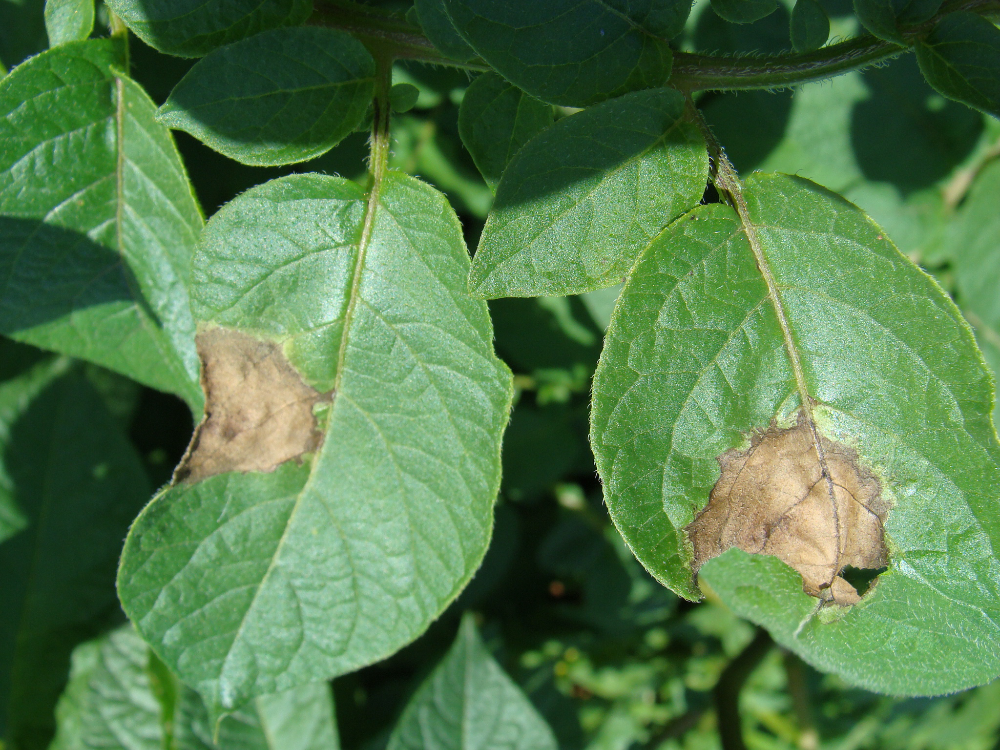

In [ ]:
from pathlib import Path
from PIL import Image
path_im = Path('requeima+manchas+grandes_000gw6fn2mm02wx7ha0myh2loys0cnwf.JPG.jpg')
image = Image.open(path_im)
image


In [ ]:
pipe(image)

[{'score': 0.9334028363227844, 'label': 'Tomato_Late_blight'},
 {'score': 0.03993864730000496, 'label': 'Potato___Late_blight'},
 {'score': 0.009762834757566452, 'label': 'Potato___Early_blight'},
 {'score': 0.007488548755645752, 'label': 'Tomato_Early_blight'},
 {'score': 0.0033540388103574514, 'label': 'Tomato_Septoria_leaf_spot'}]

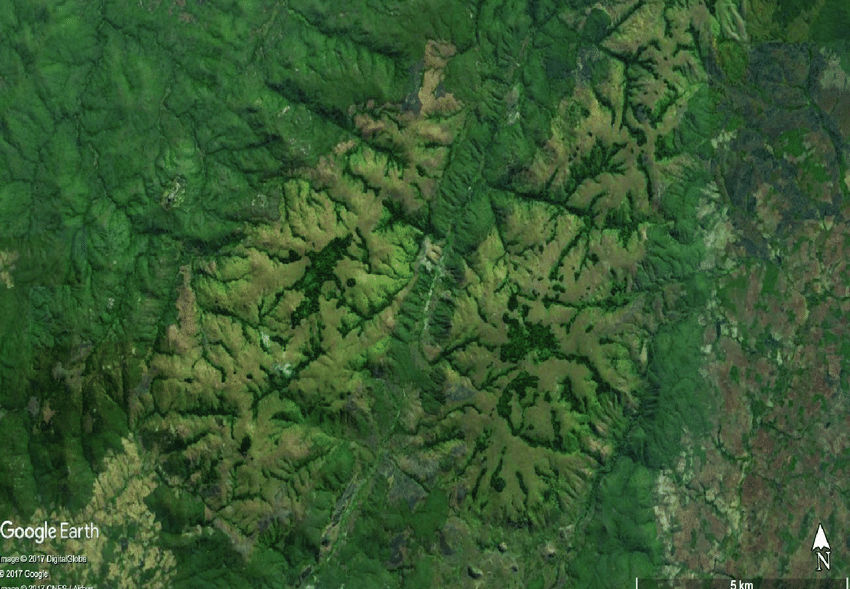

In [ ]:
from PIL import Image
import requests

url = 'https://huggingface.co/nielsr/convnext-tiny-finetuned-eurostat/resolve/main/forest.png'
image = Image.open(requests.get(url, stream=True).raw)
image

In [ ]:
pipe(image)

[{'label': 'Pepper__bell___Bacterial_spot', 'score': 0.9786471128463745},
 {'label': 'Potato___Late_blight', 'score': 0.006193913985043764},
 {'label': 'Tomato_Early_blight', 'score': 0.005424704868346453},
 {'label': 'Tomato__Target_Spot', 'score': 0.002222869312390685},
 {'label': 'Potato___Early_blight', 'score': 0.0021400651894509792}]